In [53]:
import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy.stats import norm
from statsmodels.stats.multitest import multipletests
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import connected_components
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from sklearn.preprocessing import StandardScaler

### Load expression matrix

In [2]:
adata = sc.read_h5ad("../data/features_label/raw_X/rna_seq_total") # RNA-seq data

# Build dataframe
X = pd.DataFrame(adata.X, index=adata.obs_names, columns=adata.var_names)

In [3]:
X.sum(axis=1) # check if the data is log1p transformed

22RV1_PROSTATE                            1000000.10
2313287_STOMACH                            999999.50
5637_URINARY_TRACT                        1000000.81
697_HAEMATOPOIETIC_AND_LYMPHOID_TISSUE     999999.42
769P_KIDNEY                               1000000.04
                                             ...    
YD15_SALIVARY_GLAND                       1000001.15
YD38_UPPER_AERODIGESTIVE_TRACT            1000000.34
YD8_UPPER_AERODIGESTIVE_TRACT              999960.24
ZR751_BREAST                               999990.81
ZR7530_BREAST                              999986.97
Length: 513, dtype: float64

In [4]:
# log1p transform
X = np.log1p(X)

X.columns = X.columns.astype(str)
print(f"Expression matrix shape: {X.shape}")
X.head(3)

Expression matrix shape: (513, 47020)


cell,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000273481,ENSG00000273483,ENSG00000273484,ENSG00000273485,ENSG00000273486,ENSG00000273487,ENSG00000273488,ENSG00000273489,ENSG00000273492,ENSG00000273493
22RV1_PROSTATE,1.837370,0.0,4.309187,2.375836,3.239071,0.009950,0.076961,4.022849,4.783316,3.664843,...,0.343590,0.631272,0.0,0.307485,1.078410,0.173953,1.686399,2.200552,0.009950,0.0
2313287_STOMACH,2.080691,0.0,4.700389,2.876949,2.661657,0.000000,0.207014,5.146971,4.543295,2.977568,...,0.000000,0.246860,0.0,0.000000,0.518794,0.048790,1.088562,2.124654,0.076961,0.0
5637_URINARY_TRACT,4.076520,0.0,4.604670,1.413423,3.484619,0.131028,1.091923,4.290048,2.375836,2.759377,...,0.076961,0.000000,0.0,0.000000,0.122218,0.067659,0.329304,1.420696,0.058269,0.0


### Clean and filter expression matrix

In [4]:
path_pseudogene = "../data/features_label/gene_annotation/pseudogene.txt"  # pseudogene list
path_metabolic  = "../data/features_label/gene_annotation/protein_class_Metabolic.tsv"  # metabolic protein classes
path_gene_info  = "../data/features_label/gene_annotation/gene_info.csv"  # gene id mapping

In [6]:
pseudo_df = pd.read_csv(path_pseudogene, sep="\t")
met_df   = pd.read_csv(path_metabolic, sep="\t", index_col=0)
ginfo    = pd.read_csv(path_gene_info)

In [7]:
# Collect pseudogene Ensembl IDs from the pseudogene file
pseudo_ids = set(pseudo_df["Gene stable ID"].dropna().astype(str))

# Map metabolic genes to Ensembl gene IDs
ginfo = ginfo.drop_duplicates(subset=["gene_name"])
ginfo = ginfo.set_index("gene_name")
met_df = met_df.merge(ginfo, left_index=True, right_index=True, how="left")
met_ids = set(met_df["gene_id"].dropna().astype(str))

# Combine both sets into a single exclusion list of Ensembl IDs
exclude_ids = pseudo_ids.union(met_ids)

In [8]:
n_genes_start = X.shape[1]

# Exclude pseudogenes + metabolic genes
X_step1 = X.drop(columns=[g for g in X.columns if g in exclude_ids], errors="ignore")
n_after_exclude = X_step1.shape[1]
print(f"Excluding {len(exclude_ids)} genes (pseudogenes + metabolic genes)")

Excluding 20146 genes (pseudogenes + metabolic genes)


In [9]:
#  Prevalence filter
expr_thr = np.log1p(0.5) # threshold for expression (log1p transformed)
min_frac = 0.10  # keep genes expressed in at least 10% of samples
n_samples = X_step1.shape[0]
is_detected = (X_step1 >= expr_thr).sum(axis=0) / n_samples
keep_prevalence = is_detected >= min_frac

# Variance filter
q = 0.10  # drop the bottom 10%
var_series = X_step1.var(axis=0, ddof=0)
var_cut = var_series.quantile(q)
keep_variance = var_series >= var_cut

# mask of genes to keep
keep_mask = keep_prevalence & keep_variance
X_step2 = X_step1.loc[:, keep_mask]

# remove zero-variance genes
std_step2 = X_step2.std(axis=0, ddof=0)
X_step2 = X_step2.loc[:, std_step2 > 0]

In [10]:
x_clean_no_scaled = pd.DataFrame(X_step2, index=X_step2.index, columns=X_step2.columns)
x_clean_no_scaled.head(3)

cell,ENSG00000000003,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001167,ENSG00000001460,ENSG00000001461,ENSG00000001497,ENSG00000001561,...,ENSG00000273472,ENSG00000273473,ENSG00000273474,ENSG00000273477,ENSG00000273478,ENSG00000273483,ENSG00000273485,ENSG00000273486,ENSG00000273488,ENSG00000273489
22RV1_PROSTATE,1.837370,2.375836,3.239071,0.009950,0.076961,3.664843,1.809927,3.709172,3.740523,2.589267,...,0.470004,0.810930,0.00000,0.405465,2.425687,0.631272,0.307485,1.078410,1.686399,2.200552
2313287_STOMACH,2.080691,2.876949,2.661657,0.000000,0.207014,2.977568,2.775709,3.401531,3.293983,2.832036,...,0.262364,0.086178,0.00000,0.000000,1.756132,0.246860,0.000000,0.518794,1.088562,2.124654
5637_URINARY_TRACT,4.076520,1.413423,3.484619,0.131028,1.091923,2.759377,2.247072,2.733068,4.117736,1.553925,...,0.182322,0.113329,0.19062,0.182322,0.737164,0.000000,0.000000,0.122218,0.329304,1.420696


In [12]:
# Summary of filtering steps
cols0 = set(X.columns)
cols1 = set(X_step1.columns)
cols_final = set(X_step2.columns)

removed_by_list = cols0 - cols1
removed_after_lists = cols1 - cols_final
removed_only_prevalence = set(X_step1.columns[~keep_prevalence]) - set(X_step1.columns[~keep_variance])
removed_only_variance   = set(X_step1.columns[~keep_variance])   - set(X_step1.columns[~keep_prevalence])
removed_both            = removed_after_lists - removed_only_prevalence - removed_only_variance

print(f"Genes before filtering         : {n_genes_start}")
print(f"After excluding lists          : {n_after_exclude}  (removed by lists: {len(removed_by_list)})")
print(f"After prevalence + variance    : {X_step2.shape[1]}  (removed post-lists: {len(removed_after_lists)})")
print(f"  ├─ removed by prevalence only: {len(removed_only_prevalence)}")
print(f"  ├─ removed by variance only  : {len(removed_only_variance)}")
print(f"  └─ removed by both filters   : {len(removed_both)}")
print(f"Final standardized matrix shape: {x_clean_no_scaled.shape}")

Genes before filtering         : 47020
After excluding lists          : 32555  (removed by lists: 14465)
After prevalence + variance    : 18082  (removed post-lists: 14473)
  ├─ removed by prevalence only: 11217
  ├─ removed by variance only  : 0
  └─ removed by both filters   : 3256
Final standardized matrix shape: (513, 18082)


In [ ]:
# Save cleaned data without scaling as feature matrix for ML pipelines

# x_clean_no_scaled.to_csv("../data/features_label/processed_X/x_clean_no_scaled_no_imputation.csv", index=True) 

In [ ]:
# Standardize the data for PCA 
scaler = StandardScaler(with_mean=True, with_std=True)

# Final cleaned data for PCA
X_clean = pd.DataFrame(scaler.fit_transform(X_step2), index=X_step2.index, columns=X_step2.columns)

In [ ]:
# save cleaned data for PCA as AnnData
adata_clean = ad.AnnData(X_clean)

# Keep sample and gene metadata
adata_clean.obs = adata.obs.loc[X_clean.index].copy()
adata_clean.var = adata.var.loc[X_clean.columns].copy()

adata_clean.write("../data/features_label/X_clean_no_imputation.h5ad")

### Build co-expression modules mutual KNN

In [5]:
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import connected_components
from sklearn.decomposition import PCA

In [6]:
X_clean = sc.read_h5ad("../data/features_label/processed_X/X_clean_scaled_no_imputation.h5ad")
X_clean = pd.DataFrame(X_clean.X, index=X_clean.obs_names, columns=X_clean.var_names)

#### Compute correlation matrix

In [7]:
genes = X_clean.columns.to_numpy()
n_genes = len(genes)
print(f"Computing gene-gene correlation on {n_genes} genes")

Computing gene-gene correlation on 18082 genes


In [8]:
# compute Pearson correlation matrix among genes
R = np.corrcoef(X_clean.values, rowvar=False)

# absolute correlation matrix with zeros on the diagonal
absR = np.abs(R).copy()
np.fill_diagonal(absR, 0.0)

In [9]:
tri_R = R[np.triu_indices_from(R, k=1)] # take upper triangle of R
tri_abs = np.abs(tri_R)

# Sample from distribution
n_sample = 100000
if len(tri_abs) > n_sample:
    tri_abs_sample = np.random.choice(tri_abs, size=n_sample, replace=False)
else:
    tri_abs_sample = tri_abs

In [10]:
# Sort descending to form the elbow curve
vals = np.sort(tri_abs_sample)[::-1]  
x = np.arange(1, len(vals)+1)

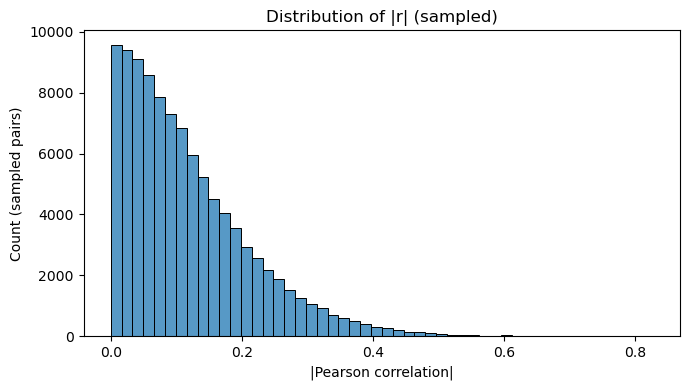

In [11]:
plt.figure(figsize=(7,4))
sns.histplot(vals, bins=50, kde=False)
plt.xlabel("|Pearson correlation|")
plt.ylabel("Count (sampled pairs)")
plt.title("Distribution of |r| (sampled)")
plt.tight_layout()
plt.show()

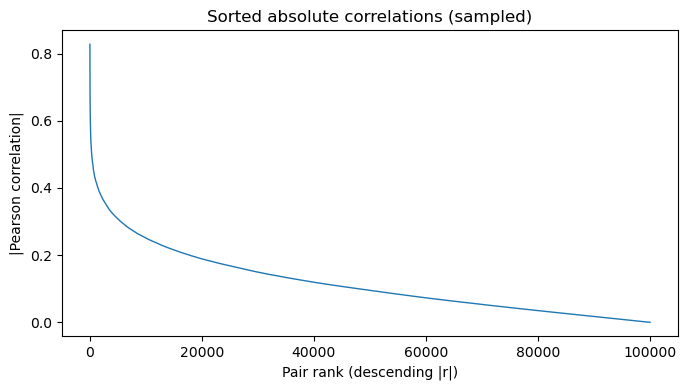

In [12]:
plt.figure(figsize=(7,4))
plt.plot(x, vals, lw=1)
plt.xlabel("Pair rank (descending |r|)")
plt.ylabel("|Pearson correlation|")
plt.title("Sorted absolute correlations (sampled)")
plt.tight_layout()
plt.show()

In [13]:
for thr in np.arange(0.30, 0.95, 0.05):
    frac = (vals >= thr).mean()
    print(f"Fraction of pairs with |r| >= {thr:.2f}: {frac*100:.2f}%")

Fraction of pairs with |r| >= 0.30: 5.49%
Fraction of pairs with |r| >= 0.35: 2.88%
Fraction of pairs with |r| >= 0.40: 1.44%
Fraction of pairs with |r| >= 0.45: 0.68%
Fraction of pairs with |r| >= 0.50: 0.32%
Fraction of pairs with |r| >= 0.55: 0.15%
Fraction of pairs with |r| >= 0.60: 0.08%
Fraction of pairs with |r| >= 0.65: 0.03%
Fraction of pairs with |r| >= 0.70: 0.02%
Fraction of pairs with |r| >= 0.75: 0.01%
Fraction of pairs with |r| >= 0.80: 0.00%
Fraction of pairs with |r| >= 0.85: 0.00%
Fraction of pairs with |r| >= 0.90: 0.00%


#### Build graph to find co-expression model

Mutual KNN

In [46]:
k = 5  # each gene keeps at most k neighbors
min_thr = 0.68 # minimum positive correlation
n = R.shape[0]  # number of genes

In [47]:
# Signed mutual kNN: use positive correlations only
R_pos = R.copy()
np.fill_diagonal(R_pos, -np.inf) # exclude self from top-k
R_pos[R_pos < 0] = -np.inf # drop negative correlations

In [48]:
# Top-k indices by highest positive r
topk_idx = np.argpartition(-R_pos, kth=min(k, n-1)-1, axis=1)[:, :min(k, n-1)]

neighbors = []
for i in range(n):
    cand = topk_idx[i]
    # keep only candidates with r >= min_thr (signed condition)
    if min_thr is not None:
        cand = cand[R_pos[i, cand] >= min_thr]
    neighbors.append(set(cand))

In [49]:
#  Build mutual adjacency
rows, cols = [], []
for i in range(n):
    for j in neighbors[i]:
        if j > i and i in neighbors[j]:
            rows.append(i); cols.append(j)
            rows.append(j); cols.append(i)  # symmetric entry

adj_mutual = csr_matrix((np.ones(len(rows), dtype=np.int8), (rows, cols)), shape=(n, n))

In [50]:
n_comp, comp_labels = connected_components(adj_mutual, directed=False)
comp_sizes = np.bincount(comp_labels)

print(f"\nSigned mutual kNN components (k={k}, min r={min_thr}): {n_comp}")
print(pd.Series(comp_sizes, name="size").describe())
print("Largest component:", comp_sizes.max())
print("Singleton components:", int((comp_sizes == 1).sum()))
print("Multi-gene components:", int((comp_sizes >= 2).sum()))


Signed mutual kNN components (k=5, min r=0.68): 14455
count    14455.000000
mean         1.250917
std          3.444704
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max        365.000000
Name: size, dtype: float64
Largest component: 365
Singleton components: 12949
Multi-gene components: 1506


In [51]:
# Build index lists per component id
comp_ids = np.arange(n_comp)
groups = [np.where(comp_labels == cid)[0] for cid in comp_ids]

# Split components by size
multi_groups = [(cid, idx) for cid, idx in zip(comp_ids, groups) if len(idx) >= 2]
singletons   = [(cid, idx) for cid, idx in zip(comp_ids, groups) if len(idx) == 1]


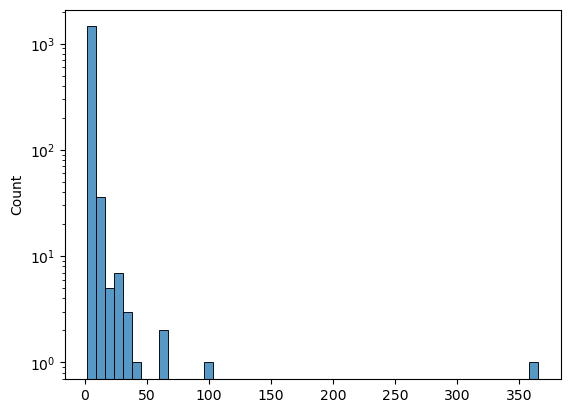

In [52]:
multi_sizes = comp_sizes[comp_sizes >= 2]

sns.histplot(multi_sizes, bins=50, kde=False)
plt.yscale("log")

#### PCA 

In [23]:
X_mat = X_clean.values
n_samples = X_clean.shape[0]

feat_blocks = [] # list of 1D arrays (PC1 or single gene)
feat_names  = [] # feature names
pc1_var_explained = {} #  variance explained by PC1 (NaN for singletons)
module_genes = {} #  list of member genes

In [ ]:
# Multi-gene components: PC1
for cid, idx in multi_groups:
    cname = f"C{cid:05d}"
    pca = PCA(n_components=1, random_state=42)
    pc1 = pca.fit_transform(X_mat[:, idx])[:, 0]  # shape (n_samples,)
    feat_blocks.append(pc1)
    feat_names.append(cname)
    pc1_var_explained[cname] = float(pca.explained_variance_ratio_[0])
    module_genes[cname] = list(genes[idx])  # store member genes for this module

# Singletons: keep standardized gene values
for _, idx in singletons:
    gname = genes[idx[0]]
    feat_blocks.append(X_mat[:, idx[0]])
    feat_names.append(gname)
    pc1_var_explained[gname] = np.nan # not applicable for singletons
    module_genes[gname] = [gname]

In [26]:
# Mapping gene -> feature 

rows_map = []
for feat, members in module_genes.items():
    for g in members:
        rows_map.append((g, feat))
gene_to_feature = pd.DataFrame(rows_map, columns=["gene", "feature"])

In [ ]:
# Module summary tabl

module_summary = pd.DataFrame({
    "feature": list(module_genes.keys()),
    "size":    [len(module_genes[f]) for f in module_genes.keys()],
    "pc1_var_explained": [pc1_var_explained[f] for f in module_genes.keys()],
    "n_samples": n_samples,
    "genes":   [module_genes[f] for f in module_genes.keys()]  # keep as list; serialize later if you want
}).sort_values(["size", "feature"], ascending=[False, True]).reset_index(drop=True)

print("Module summary preview:")
display(module_summary.head(10))

print("Gene→feature mapping preview:")
display(gene_to_feature.head(10))

Module summary preview:


,feature,size,pc1_var_explained,n_samples,genes
0,C00002,365,0.399974,513,"[ENSG00000000460, ENSG00000003756, ENSG0000000..."
1,C00038,101,0.436949,513,"[ENSG00000004777, ENSG00000008018, ENSG0000001..."
2,C00000,65,0.584797,513,"[ENSG00000000003, ENSG00000005884, ENSG0000000..."
3,C00225,65,0.403344,513,"[ENSG00000013523, ENSG00000032219, ENSG0000005..."
4,C00537,39,0.526474,513,"[ENSG00000058673, ENSG00000116580, ENSG0000011..."
5,C01059,37,0.541425,513,"[ENSG00000083520, ENSG00000083535, ENSG0000008..."
6,C00256,36,0.567850,513,"[ENSG00000018869, ENSG00000120784, ENSG0000016..."
7,C00112,35,0.586828,513,"[ENSG00000007129, ENSG00000007312, ENSG0000004..."
8,C00548,29,0.601279,513,"[ENSG00000060069, ENSG00000075336, ENSG0000007..."
9,C01021,29,0.624587,513,"[ENSG00000081665, ENSG00000105750, ENSG0000011..."


Gene→feature mapping preview:


,gene,feature
0,ENSG00000000003,C00000
1,ENSG00000005884,C00000
2,ENSG00000006327,C00000
3,ENSG00000006453,C00000
4,ENSG00000024422,C00000
5,ENSG00000050820,C00000
6,ENSG00000061676,C00000
7,ENSG00000070087,C00000
8,ENSG00000070778,C00000
9,ENSG00000073712,C00000


In [30]:
# Save mixed feature matrix
X_mixed.to_csv("../data/features_label/processed_X/X_mixed_no_imputation.csv")

# Save gene-to-feature mapping
gene_to_feature.to_csv("../data/features_label/co_expression_info/gene_to_feature.csv", index=False)

# Save also module summary if you want to keep variance explained etc.
module_summary.to_csv("../data/features_label/co_expression_info/module_summary.csv", index=False)